# **Environment Setup**
Prerequisites
Python : Ensure Python 3.7 or higher is installed.
CUDA (Optional) : If using GPU acceleration, ensure CUDA is properly set up.
Install Required Libraries
Run the following commands to install necessary packages:

In [1]:
!pip install --upgrade imbalanced-learn
!pip install ultralytics
!pip install roboflow

import os
import sys
import gc
import time
import shutil
import random
import yaml
import joblib
import torch
import cv2
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from collections import defaultdict
from PIL import Image
from IPython.display import YouTubeVideo
from mlxtend.plotting import plot_decision_regions

# Scikit-learn modules
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import (
    StratifiedKFold, cross_val_score, GridSearchCV, 
    train_test_split, RandomizedSearchCV, validation_curve
)
from sklearn.pipeline import make_pipeline
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import (
    confusion_matrix, classification_report, 
    accuracy_score, f1_score, roc_curve, auc
)
from sklearn.ensemble import RandomForestClassifier
from sklearn.manifold import TSNE

# Image processing and feature extraction
from skimage.feature import local_binary_pattern, hog
from skimage import exposure

# TensorFlow and Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, regularizers, backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import (
    Dense, Activation, Dropout, Conv2D, 
    MaxPooling2D, BatchNormalization
)
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Imbalanced learning techniques
from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.combine import SMOTETomek

# Parallel processing
from joblib import Parallel, delayed

# YOLO for object detection
from ultralytics import YOLO

# Set TensorFlow log level
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

# Set Seaborn style
sns.set_style('darkgrid')

print("All modules have been imported successfully.")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 238.4/238.4 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 83.2 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2
  Attempting uninstall: imbalanced-learn
    Found existing installation: imbalanced-learn 0.12.4
    Uninstalling imbalanced-learn-0.12.4:
      Successfully uninstalled imbalanced-learn-0.12.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
category-encoders 2.7.0 requires scikit-learn<1.6.0,>=1.0.0, but you have scikit-learn 1.6.1 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.2/949.2 kB 16.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━

In [2]:
from roboflow import Roboflow
rf = Roboflow(api_key="k7krLTP9ELURq7rNspoz")
project = rf.workspace("narayana-college").project("waste-classification8k-wephl")
version = project.version(1)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to waste-classification8K-1 in yolov8:: 100%|██████████| 12050/12050 [00:01<00:00, 8080.14it/s]


# Data Cleaning & Visualize Data Distribution
Process the data by updating label files and removing unwanted classes and generate bar charts and tables to visualize the distribution of classes:

In [3]:
# Define the dataset path
dataset_path = "/kaggle/working/waste-classification8K-1"

# Define old class mappings
old_to_new_classes = {
    0: 0,  # Clothes Waste → Clothes Waste (recyclable)
    1: 1,  # Food Waste → Food - Biodegradable (non_recyclable)
    2: 2,  # Glass → Glass - Non-Biodegradable (recyclable)
    3: 3,  # Hazardous Waste → Hazardous Waste (non_recyclable)
    4: 4,  # Medical Waste → Medical Waste (non_recyclable)
    5: 5,  # Metal → Metal (recyclable)
    6: 6,  # Paper → Paper (recyclable)
    7: 7,  # Plastic → Plastic (recyclable)
    8: 7,  # Plastic → Plastic (recyclable)
    9: 7,  # Plastic → Plastic (recyclable)
}

# Function to update label files
def update_labels(label_folder):
    for label_file in os.listdir(label_folder):
        if label_file.endswith(".txt"):
            label_path = os.path.join(label_folder, label_file)
            with open(label_path, "r") as file:
                lines = file.readlines()

            updated_lines = []
            for line in lines:
                parts = line.split()
                old_class_id = int(parts[0])

                # Map old class ID to new class ID
                if old_class_id in old_to_new_classes:
                    parts[0] = str(old_to_new_classes[old_class_id])

                updated_lines.append(" ".join(parts) + "\n")

            # Save modified labels
            with open(label_path, "w") as file:
                file.writelines(updated_lines)

# Apply updates to all dataset splits
for split in ["train", "valid", "test"]:
    label_folder = os.path.join(dataset_path, split, "labels")
    if os.path.exists(label_folder):
        update_labels(label_folder)

print(" Label files updated successfully!")

 Label files updated successfully!


In [4]:
# Path to your data.yaml
yaml_path = "/kaggle/working/waste-classification8K-1/data.yaml"

# Load existing YAML
with open(yaml_path, "r") as file:
    data = yaml.safe_load(file)

# Define the simplified class names (without bio/non-bio terms)
new_names = [
    "Clothes Waste (Recyclable)" ,
    "Food (Non-Recyclable)",
    "Glass (Recyclable)",
    "Hazardous Waste (Non-Recyclable)",
    "Medical Waste (Non-Recyclable)",
    "Metal (Recyclable)",
    "Paper (Recyclable)",
    "Plastic (Recyclable)",
]

# Update YAML data
data["names"] = new_names
data["nc"] = len(new_names)  # Ensure nc matches the number of classes (9)

# Save modified YAML
with open(yaml_path, "w") as file:
    yaml.dump(data, file, sort_keys=False)

print(f"YAML updated successfully! New nc: {data['nc']}, New names: {data['names']}")

YAML updated successfully! New nc: 8, New names: ['Clothes Waste (Recyclable)', 'Food (Non-Recyclable)', 'Glass (Recyclable)', 'Hazardous Waste (Non-Recyclable)', 'Medical Waste (Non-Recyclable)', 'Metal (Recyclable)', 'Paper (Recyclable)', 'Plastic (Recyclable)']


In [5]:
dataset_path = "/kaggle/working/waste-classification8K-1"
splits = ["train", "valid", "test"]

# Rubber originally class 10
rubber_class_id = 10

# Function to delete rubber class images
for split in splits:
    label_folder = os.path.join(dataset_path, split, "labels")
    image_folder = os.path.join(dataset_path, split, "images")

    if not os.path.exists(label_folder):
        continue

    for label_file in os.listdir(label_folder):
        if not label_file.endswith(".txt"):
            continue

        label_path = os.path.join(label_folder, label_file)
        remove_file = False

        with open(label_path, "r") as f:
            lines = f.readlines()

        # Check if any line in the label file has the rubber class index
        for line in lines:
            tokens = line.strip().split()
            if len(tokens) == 0:
                continue
            try:
                cls = int(tokens[0])
                if cls == rubber_class_id:
                    remove_file = True
                    break
            except ValueError:
                continue

        if remove_file:
            try:
                os.remove(label_path)
                print(f"Removed label file: {label_path}")
            except Exception as e:
                print(f"Error deleting {label_path}: {e}")


            base_name = os.path.splitext(label_file)[0]

            for ext in [".jpg", ".jpeg", ".png"]:
                image_path = os.path.join(image_folder, base_name + ext)
                if os.path.exists(image_path):
                    try:
                        os.remove(image_path)
                        print(f"Removed image file: {image_path}")
                    except Exception as e:
                        print(f"Error deleting {image_path}: {e}")

Removed label file: /kaggle/working/waste-classification8K-1/train/labels/r-105-_jpg.rf.a536d77d891be36cc9d76ffd2f6d50b0.txt
Removed image file: /kaggle/working/waste-classification8K-1/train/images/r-105-_jpg.rf.a536d77d891be36cc9d76ffd2f6d50b0.jpg
Removed label file: /kaggle/working/waste-classification8K-1/train/labels/r-8-_jpg.rf.2fd9a44c26d5792265563e9d46a71f96.txt
Removed image file: /kaggle/working/waste-classification8K-1/train/images/r-8-_jpg.rf.2fd9a44c26d5792265563e9d46a71f96.jpg
Removed label file: /kaggle/working/waste-classification8K-1/train/labels/r-104-_jpg.rf.759a3b6961f619de4d12c3d82737b71c.txt
Removed image file: /kaggle/working/waste-classification8K-1/train/images/r-104-_jpg.rf.759a3b6961f619de4d12c3d82737b71c.jpg
Removed label file: /kaggle/working/waste-classification8K-1/train/labels/r-48-_jpg.rf.87fc4e074dbd80d1271a9d07532b7903.txt
Removed image file: /kaggle/working/waste-classification8K-1/train/images/r-48-_jpg.rf.87fc4e074dbd80d1271a9d07532b7903.jpg
Remove

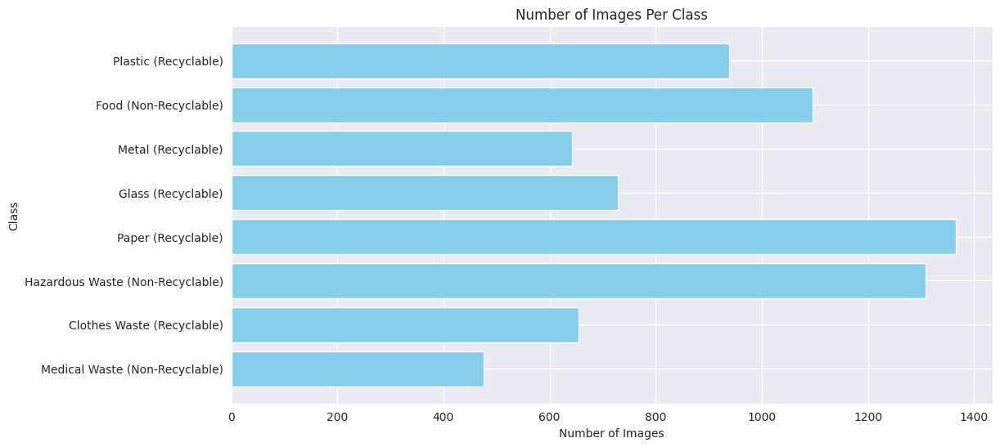

,Class,Number of Images
0,Plastic (Recyclable),939
1,Food (Non-Recyclable),1096
2,Metal (Recyclable),643
3,Glass (Recyclable),729
4,Paper (Recyclable),1366
5,Hazardous Waste (Non-Recyclable),1308
6,Clothes Waste (Recyclable),655
7,Medical Waste (Non-Recyclable),475


In [6]:
class_names = data["names"]
num_classes = len(class_names)

class_counts = defaultdict(int)

# Loop through dataset splits and count images per class
for split in splits:
    labels_folder = os.path.join(dataset_path, split, "labels")

    if os.path.exists(labels_folder):
        for label_file in os.listdir(labels_folder):
            label_path = os.path.join(labels_folder, label_file)
            with open(label_path, "r") as file:
                for line in file.readlines():
                    class_id = int(line.split()[0])  # Get class index
                    class_counts[class_names[class_id]] += 1  # Increment count

df_class_counts = pd.DataFrame(list(class_counts.items()), columns=["Class", "Number of Images"])

plt.figure(figsize=(12, 6))
plt.barh(df_class_counts["Class"], df_class_counts["Number of Images"], color="skyblue")
plt.xlabel("Number of Images")
plt.ylabel("Class")
plt.title("Number of Images Per Class")
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.show()

#Print the image counts per class
df_class_counts

# **Training and Testing**
Train the YOLOv8 model with the provided dataset:

In [7]:
# Load YOLOv8 model
model = YOLO("yolov8n.pt")

# Train the model
results = model.train(
    data="/kaggle/working/waste-classification8K-1/data.yaml",
    epochs=20,
    batch=16,
    
    imgsz=640,
    workers=2,
    device="cuda",
    augment=True,
    lr0= 0.001
)
#save the pretrained model
model.save("yolov8_trained_recyclable.pt")
print(" yolov8 model trained and saved")

100%|██████████| 6.25M/6.25M [00:00<00:00, 58.9MB/s]


Ultralytics 8.3.91 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/waste-classification8K-1/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=2, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sho

100%|██████████| 755k/755k [00:00<00:00, 17.4MB/s]


Overriding model.yaml nc=80 with nc=8

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 72.4MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/waste-classification8K-1/train/labels... 4156 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4156/4156 [00:04<00:00, 968.12it/s]


train: New cache created: /kaggle/working/waste-classification8K-1/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
val: Scanning /kaggle/working/waste-classification8K-1/valid/labels... 1169 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1169/1169 [00:01<00:00, 854.49it/s]


val: New cache created: /kaggle/working/waste-classification8K-1/valid/labels.cache
Plotting labels to /usr/local/lib/python3.10/dist-packages/tests/tmp/runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000833, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /usr/local/lib/python3.10/dist-packages/tests/tmp/runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      2.09G     0.8432      2.608      1.326         39        640: 100%|██████████| 260/260 [00:46<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:08<00:00,  4.27it/s]


                   all       1169       1479      0.552      0.495      0.479      0.328

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      2.56G     0.8717      1.955      1.336         32        640: 100%|██████████| 260/260 [00:42<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:07<00:00,  5.06it/s]


                   all       1169       1479       0.44       0.45      0.423      0.268

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      2.56G     0.9043      1.815      1.354         31        640: 100%|██████████| 260/260 [00:43<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:07<00:00,  5.27it/s]


                   all       1169       1479      0.556       0.47      0.518      0.343

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      2.56G     0.8989      1.699      1.355         43        640: 100%|██████████| 260/260 [00:43<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:07<00:00,  5.06it/s]


                   all       1169       1479       0.62      0.563      0.599      0.415

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      2.56G     0.8822      1.566      1.342         36        640: 100%|██████████| 260/260 [00:42<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.31it/s]

                   all       1169       1479      0.575      0.601      0.604       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      2.56G     0.8437      1.476      1.316         36        640: 100%|██████████| 260/260 [00:43<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.50it/s]

                   all       1169       1479      0.635      0.558      0.624      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      2.56G     0.8394      1.394      1.302         37        640: 100%|██████████| 260/260 [00:44<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.35it/s]

                   all       1169       1479      0.638      0.601      0.646      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      2.56G     0.8252      1.354      1.298         46        640: 100%|██████████| 260/260 [00:43<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.46it/s]

                   all       1169       1479      0.732      0.549      0.653      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      2.56G      0.805      1.281      1.284         38        640: 100%|██████████| 260/260 [00:43<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:07<00:00,  5.25it/s]

                   all       1169       1479      0.668      0.664      0.715      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      2.56G     0.7741      1.225      1.262         32        640: 100%|██████████| 260/260 [00:44<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.48it/s]

                   all       1169       1479      0.744       0.66      0.743      0.552


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      2.56G     0.6991       1.19      1.381         16        640: 100%|██████████| 260/260 [00:42<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:07<00:00,  5.27it/s]

                   all       1169       1479      0.753      0.684      0.751      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      2.56G     0.6582      1.082      1.337         17        640: 100%|██████████| 260/260 [00:40<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.47it/s]

                   all       1169       1479      0.716        0.7      0.741      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      2.56G     0.6411      1.006      1.323         14        640: 100%|██████████| 260/260 [00:40<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:07<00:00,  5.24it/s]

                   all       1169       1479      0.741      0.701      0.748      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      2.56G     0.6266     0.9399      1.307         13        640: 100%|██████████| 260/260 [00:40<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.58it/s]

                   all       1169       1479      0.795      0.695      0.772        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      2.56G     0.5994     0.8856      1.279         14        640: 100%|██████████| 260/260 [00:40<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.30it/s]

                   all       1169       1479       0.77      0.718      0.785      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      2.56G      0.577     0.8351      1.256         13        640: 100%|██████████| 260/260 [00:40<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.51it/s]

                   all       1169       1479       0.81      0.729      0.793       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      2.56G     0.5681     0.7703      1.248         12        640: 100%|██████████| 260/260 [00:40<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.36it/s]

                   all       1169       1479      0.818      0.699      0.798      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      2.56G      0.551     0.7212      1.227         16        640: 100%|██████████| 260/260 [00:40<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.46it/s]

                   all       1169       1479      0.817      0.728      0.804      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      2.56G     0.5367     0.6876      1.209         15        640: 100%|██████████| 260/260 [00:40<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.37it/s]

                   all       1169       1479      0.856      0.737      0.821      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      2.56G     0.5222     0.6498      1.205         12        640: 100%|██████████| 260/260 [00:40<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:06<00:00,  5.38it/s]

                   all       1169       1479       0.85      0.731      0.815      0.665



20 epochs completed in 0.276 hours.
Optimizer stripped from /usr/local/lib/python3.10/dist-packages/tests/tmp/runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from /usr/local/lib/python3.10/dist-packages/tests/tmp/runs/detect/train/weights/best.pt, 6.2MB

Validating /usr/local/lib/python3.10/dist-packages/tests/tmp/runs/detect/train/weights/best.pt...
Ultralytics 8.3.91 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,007,208 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:12<00:00,  2.88it/s]


                   all       1169       1479      0.855      0.743      0.829      0.689
Clothes Waste (Recyclable)        142        151      0.954      0.822      0.936      0.842
 Food (Non-Recyclable)        201        229      0.935      0.813       0.89      0.715
    Glass (Recyclable)        124        135      0.766      0.889      0.914      0.825
Hazardous Waste (Non-Recyclable)        245        280      0.926      0.754      0.844      0.675
Medical Waste (Non-Recyclable)         84         89      0.905      0.697       0.85      0.585
    Metal (Recyclable)        101        132      0.765      0.644      0.704      0.641
    Paper (Recyclable)        116        262      0.734      0.687      0.759      0.617
  Plastic (Recyclable)        163        201       0.86       0.64      0.737      0.612


invalid value encountered in less
invalid value encountered in less


Speed: 0.2ms preprocess, 7.1ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /usr/local/lib/python3.10/dist-packages/tests/tmp/runs/detect/train
 yolov8 model trained and saved


# **Evaluate Model**
Evaluate the trained model to get performance metrics:

In [8]:
# Save the trained model
model.save("yolov8_trained_recyclable.pt")
print(" Model trained on Recyclables and saved.")
model = YOLO("yolov8_trained_recyclable.pt")
metrics = model.val()
conf_matrix = metrics.confusion_matrix.matrix
print("Confusion Matrix Shape:", conf_matrix.shape)
# Print accuracy metrics
print(f"Validation Results:")
print(f"mAP@50: {metrics.box.map50:.4f}")       # mAP at 50% IoU
print(f"mAP@50-95: {metrics.box.map:.4f}")     # mAP at IoU range 50-95%
print(f"Precision: {metrics.box.mp:.4f}")      # Mean precision
print(f"Recall: {metrics.box.mr:.4f}")         # Mean recall

 Model trained on Recyclables and saved.
Ultralytics 8.3.91 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,007,208 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/working/waste-classification8K-1/valid/labels.cache... 1169 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1169/1169 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:10<00:00,  7.38it/s]


                   all       1169       1479      0.851       0.73      0.815      0.665
Clothes Waste (Recyclable)        142        151       0.94      0.824       0.93      0.803
 Food (Non-Recyclable)        201        229      0.937      0.777      0.888      0.692
    Glass (Recyclable)        124        135      0.756      0.872      0.894      0.792
Hazardous Waste (Non-Recyclable)        245        280      0.899      0.732      0.825      0.646
Medical Waste (Non-Recyclable)         84         89      0.869      0.753      0.836      0.574
    Metal (Recyclable)        101        132      0.798      0.627      0.691       0.63
    Paper (Recyclable)        116        262      0.751      0.679      0.735      0.596
  Plastic (Recyclable)        163        201      0.862      0.577      0.724      0.587


invalid value encountered in less
invalid value encountered in less


Speed: 0.4ms preprocess, 3.8ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /usr/local/lib/python3.10/dist-packages/tests/tmp/runs/detect/val
Confusion Matrix Shape: (9, 9)
Validation Results:
mAP@50: 0.8154
mAP@50-95: 0.6650
Precision: 0.8513
Recall: 0.7302



image 1/1 /kaggle/working/waste-classification8K-1/test/images/glass-155-_jpg.rf.d1e3e61e78f30c0559c729df2e893d7e.jpg: 640x640 2 Glass (Recyclable)s, 7.4ms
Speed: 2.1ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


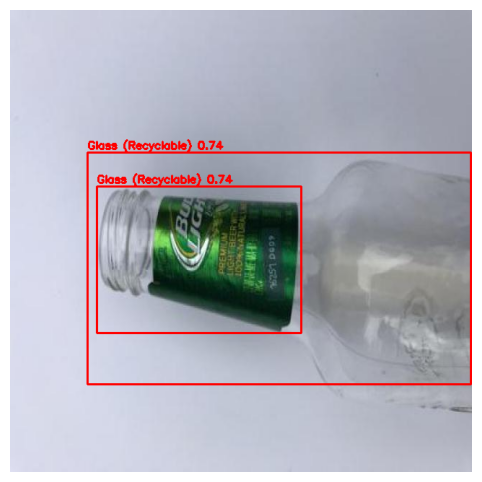


image 1/1 /kaggle/working/waste-classification8K-1/test/images/plastic-425-_jpg.rf.8ac37deff8362394fab889b70d86a401.jpg: 640x640 1 Plastic (Recyclable), 7.5ms
Speed: 1.5ms preprocess, 7.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


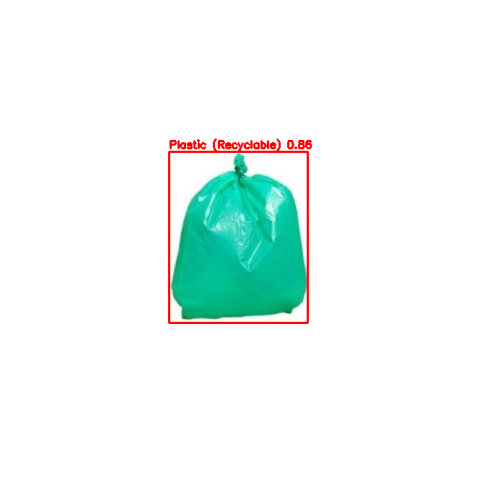


image 1/1 /kaggle/working/waste-classification8K-1/test/images/metal-189-_jpg.rf.c9ff7d7a9000e0a69a8211b3323ecba2.jpg: 640x640 1 Metal (Recyclable), 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


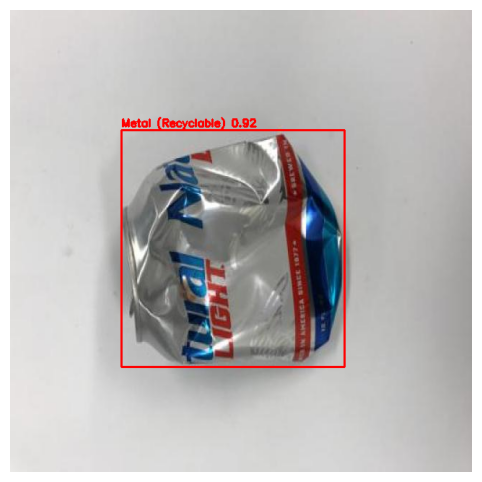


image 1/1 /kaggle/working/waste-classification8K-1/test/images/plastic-1075-_jpg.rf.d87cca42cb9d263d92b5cf875bf4fba1.jpg: 640x640 1 Plastic (Recyclable), 7.5ms
Speed: 1.7ms preprocess, 7.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


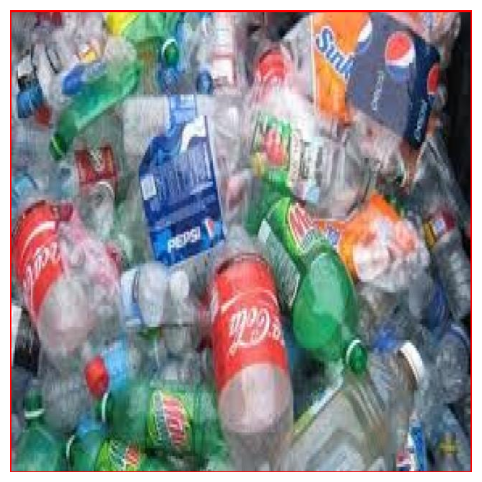


image 1/1 /kaggle/working/waste-classification8K-1/test/images/plastic-506-_jpg.rf.f82cb86a3642f34675a196772d8127c4.jpg: 640x640 1 Plastic (Recyclable), 8.3ms
Speed: 1.8ms preprocess, 8.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


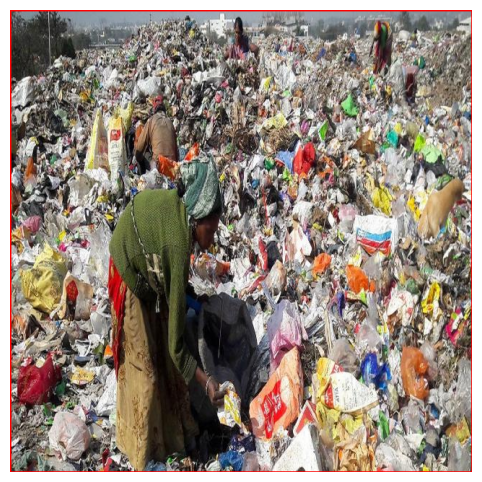


image 1/1 /kaggle/working/waste-classification8K-1/test/images/medical-waste-51-_jpg.rf.fb85a180797e5003ab88798729304e06.jpg: 640x640 1 Glass (Recyclable), 1 Hazardous Waste (Non-Recyclable), 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


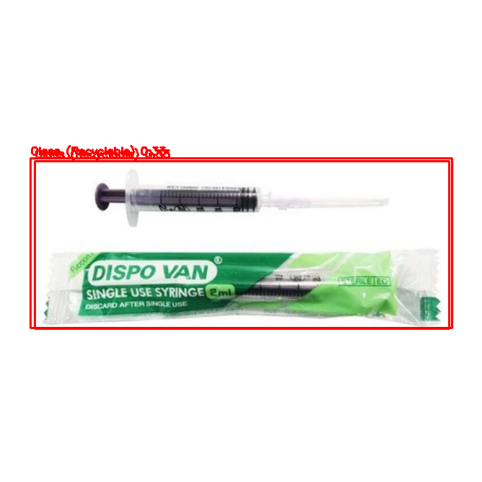


image 1/1 /kaggle/working/waste-classification8K-1/test/images/metal-40-_jpg.rf.6952a67944d6b3d3544441c525e76bae.jpg: 640x640 1 Metal (Recyclable), 8.0ms
Speed: 1.6ms preprocess, 8.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


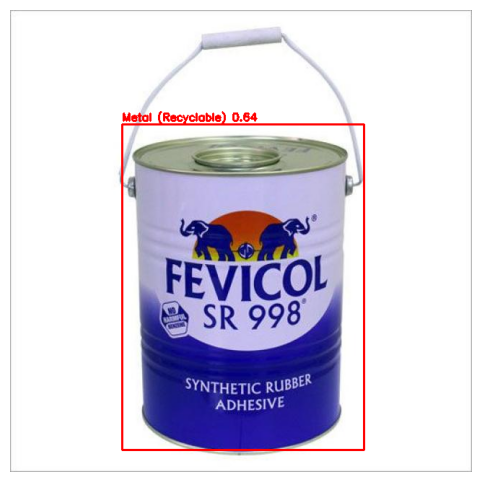


image 1/1 /kaggle/working/waste-classification8K-1/test/images/hzw-972-_jpg.rf.a36071755db2cbba7f4fc4a59025917e.jpg: 640x640 1 Hazardous Waste (Non-Recyclable), 7.6ms
Speed: 1.8ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


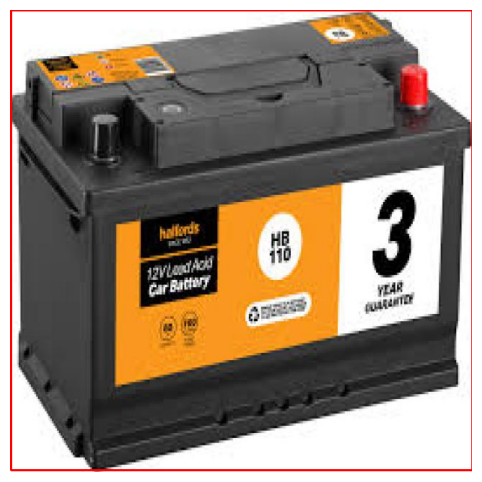


image 1/1 /kaggle/working/waste-classification8K-1/test/images/paper-277-_jpg.rf.c5776cb65157ee5cb2c9bf3d2a0c80a2.jpg: 640x640 (no detections), 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


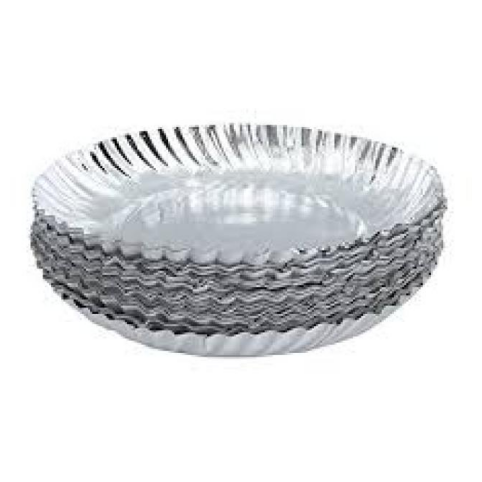


image 1/1 /kaggle/working/waste-classification8K-1/test/images/paper-90-_jpeg.rf.54bd62f42a89eba21901a0a3d54cad44.jpg: 640x640 2 Paper (Recyclable)s, 7.4ms
Speed: 1.5ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


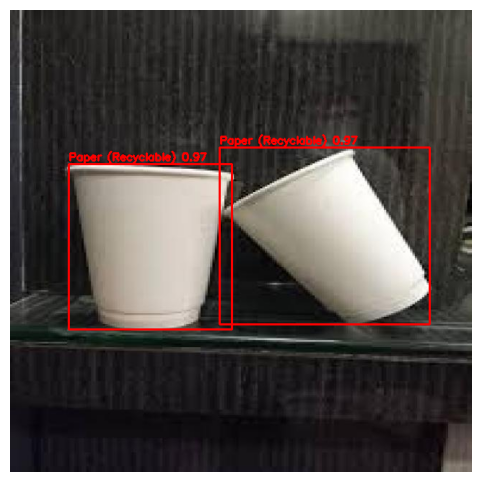

In [9]:
import glob
# Get a few sample test images
test_images = glob.glob("/kaggle/working/waste-classification8K-1/test/images/*.jpg")[40:50]

# Run inference and visualize results
for img_path in test_images:
    results = model(img_path)  

    # Convert results 
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  

    # Draw bounding boxes
    for result in results:
        for box in result.boxes.xyxy: 
            x1, y1, x2, y2 = map(int, box[:4])  # Get bounding box
            cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Draw box
            label = f"{model.names[int(result.boxes.cls[0])]} {result.boxes.conf[0]:.2f}"  # Label + Confidence
            cv2.putText(img, label, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    # Display images
    plt.figure(figsize=(8, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.show()

# **Feature Extraction**
helper functions:

**extract_features** is used to extract features from yolov8 convolutional layer (6 in this case).

**visualize_pca_projection** uses PCA to visualize classes projected in 2D with colour mapping

**display_random_batch** to test images with predictions

In [10]:
def extract_features_with_labels(model, image_dir, label_dir, layer_index=6, resize_dim=(320, 320)):
    """
    Extract features and labels from images using corresponding label files.
    
    Args:
        model: Trained YOLOv8 model.
        image_dir: Directory containing images.
        label_dir: Directory containing YOLO-format label text files.
        layer_index: Index of the model layer to extract features from.
        resize_dim: Tuple for image resizing (width, height).
    
    Returns:
        features: Numpy array of extracted features.
        raw_labels: List of class names for each image.
        class_names: Same as raw_labels (for backward compatibility).
    """
    device = next(model.parameters()).device
    features_list = []
    raw_labels = []  # This will hold the human-readable class names

    # List images (sorted for consistency)
    image_paths = sorted([os.path.join(image_dir, f) 
                          for f in os.listdir(image_dir) 
                          if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

    for image_path in image_paths:
        # Construct the corresponding label file path (assumes same basename with .txt)
        base = os.path.splitext(os.path.basename(image_path))[0]
        label_file = os.path.join(label_dir, base + ".txt")
        if os.path.exists(label_file):
            with open(label_file, "r") as f:
                lines = f.readlines()
            if lines:
                # Assuming one label per image (or take the first label if multiple exist)
                tokens = lines[0].strip().split()
                try:
                    cls_id = int(tokens[0])
                    # Map the class id to the corresponding name from new_names
                    label = new_names[cls_id] if cls_id < len(new_names) else "Unknown"
                except Exception as e:
                    print(f"Error parsing label from {label_file}: {e}")
                    label = "Unknown"
            else:
                label = "Unknown"
        else:
            print(f"Label file not found for image: {image_path}")
            label = "Unknown"
        
        # Append the label
        raw_labels.append(label)

        # Load and preprocess image
        img = cv2.imread(image_path)
        if img is None:
            print(f"Warning: Could not read {image_path}")
            continue
        if resize_dim:
            img = cv2.resize(img, resize_dim)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_tensor = torch.from_numpy(img).float().permute(2, 0, 1) / 255.0
        img_tensor = img_tensor.unsqueeze(0).to(device)

        # Forward pass through the model up to the desired layer
        with torch.no_grad():
            x = img_tensor
            for j in range(layer_index + 1):
                x = model.model.model[j](x)
            features = x.flatten().cpu().numpy()
        features_list.append(features)

        # Free memory for each image if needed
        gc.collect()
        if device.type == "cuda":
            torch.cuda.empty_cache()

    features = np.array(features_list)
    # Here we set class_names to be the same as raw_labels, which can be used for visualization.
    return features, raw_labels, raw_labels


def visualize_pca_projection(features, encoded_labels, raw_labels):
    """
    Visualize 2D PCA projection of features with class color coding.
    
    Args:
        features: Feature vectors.
        encoded_labels: Numerical labels.
        raw_labels: Raw labels (used to get a representative class name).
    """
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)
    pca = PCA(n_components=2)
    principal_components = pca.fit_transform(features_scaled)

    plt.figure(figsize=(14, 10))
    unique_labels = np.unique(encoded_labels)
    cmap = plt.cm.get_cmap('tab10', len(unique_labels))

    for label in unique_labels:
        idx = np.where(encoded_labels == label)[0]
        if idx.size == 0:
            continue
        # Use the first occurrence for naming
        class_name = raw_labels[idx[0]]
        plt.scatter(principal_components[idx, 0],
                    principal_components[idx, 1],
                    c=[cmap(label)],
                    label=class_name,
                    alpha=0.7,
                    edgecolor='w',
                    s=60)
    
    plt.title('2D PCA Projection of YOLOv8 Features', pad=20)
    plt.xlabel('Principal Component 1', labelpad=10)
    plt.ylabel('Principal Component 2', labelpad=10)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Classes')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

def display_random_batch(test_df, test_labels, test_predictions, label_encoder, batch_size=10):
   
    random_indices = np.random.choice(len(test_df), size=batch_size, replace=False)
    fig, axes = plt.subplots(2, batch_size // 2, figsize=(15, 10))
    axes = axes.flatten()

    for i, idx in enumerate(random_indices):
        img_path = test_df.iloc[idx]['filepaths']
        img = cv2.imread(img_path, cv2.IMREAD_COLOR)
        
        if img is None:
            print(f"Warning: Unable to read image {img_path}")
            continue

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        true_label = test_labels[idx]
        predicted_label = test_predictions[idx]
        true_class = label_encoder.inverse_transform([true_label])[0]
        predicted_class = label_encoder.inverse_transform([predicted_label])[0]

        axes[i].imshow(img)
        axes[i].set_title(f"True: {true_class}\nPred: {predicted_class}", fontsize=10,
                          color="green" if true_class == predicted_class else "red")
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# Random Forest Classifier

In [11]:
# Paths and configuration
train_image_dir = "/kaggle/working/waste-classification8K-1/train/images"
train_label_dir = "/kaggle/working/waste-classification8K-1/train/labels"  # Define train label directory
test_image_dir = "/kaggle/working/waste-classification8K-1/test/images"
test_label_dir = "/kaggle/working/waste-classification8K-1/test/labels"    # Define test label directory
layer_index = 6

# --- Feature extraction on training images ---
features, raw_labels, class_names = extract_features_with_labels(model, train_image_dir, train_label_dir, layer_index=layer_index)
if features.size == 0:
    raise ValueError("No valid features extracted from training images. Check the image paths and layer index.")
    
# Encode labels
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(raw_labels)

# Split the data into training and validation sets (stratified)
X_train, X_val, y_train, y_val, raw_train, raw_val = train_test_split(
    features, labels_encoded, raw_labels, test_size=0.2, random_state=42, stratify=labels_encoded
)

In [12]:
# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# Hyperparameter tuning with RandomForest
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

rf = RandomForestClassifier(class_weight="balanced", random_state=42, n_jobs=-1)
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_grid,
    n_iter=8,
    scoring='accuracy',
    cv=cv,
    n_jobs=-1,
    random_state=42,
    verbose=1
)

random_search.fit(X_train_scaled, y_train)
print("Best Parameters:", random_search.best_params_)
print("Best cross-validation score:", random_search.best_score_)

# Train the best model
best_rf_model = random_search.best_estimator_
best_rf_model.fit(X_train_scaled, y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits
Best Parameters: {'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_depth': 10}
Best cross-validation score: 0.6215403128760529


RandomForestClassifier(class_weight='balanced', max_depth=10,
                       min_samples_leaf=4, min_samples_split=5,
                       n_estimators=200, n_jobs=-1, random_state=42)

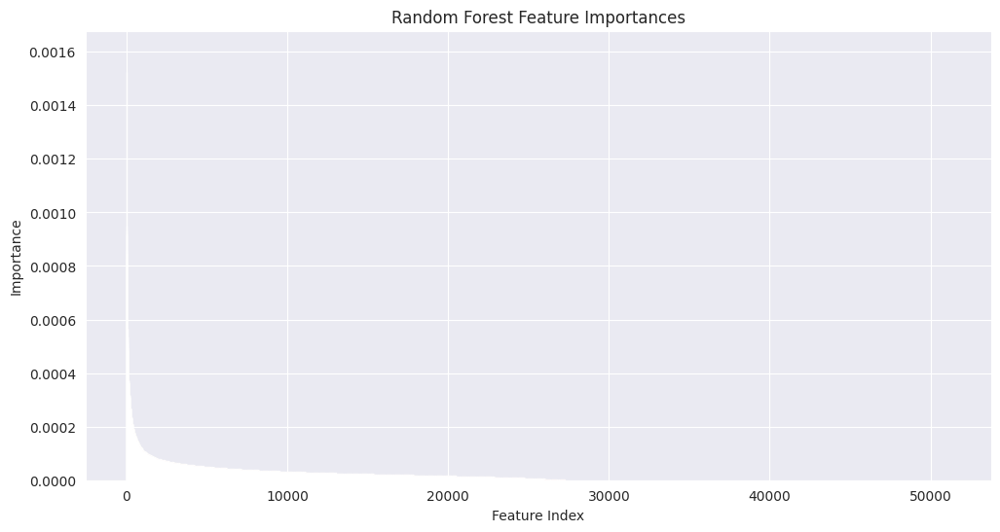

In [13]:
importances = best_rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

# Create the plot
plt.figure(figsize=(12, 6))
plt.title("Random Forest Feature Importances")
plt.bar(range(len(importances)), importances[indices], align="center", color='red')
plt.xlabel("Feature Index")
plt.ylabel("Importance")

# Set y-axis limits to better visualize the bars
plt.ylim(0, max(importances) * 1.1)

plt.show()

Validation Accuracy: 0.6298076923076923
Validation Classification Report:
                                   precision    recall  f1-score   support

      Clothes Waste (Recyclable)       0.69      0.70      0.69        84
           Food (Non-Recyclable)       0.68      0.92      0.78       137
              Glass (Recyclable)       0.55      0.57      0.56        93
Hazardous Waste (Non-Recyclable)       0.65      0.86      0.74       166
  Medical Waste (Non-Recyclable)       0.63      0.62      0.62        65
              Metal (Recyclable)       0.57      0.38      0.46        71
              Paper (Recyclable)       0.56      0.27      0.37       110
            Plastic (Recyclable)       0.57      0.44      0.50       106

                        accuracy                           0.63       832
                       macro avg       0.61      0.59      0.59       832
                    weighted avg       0.62      0.63      0.61       832



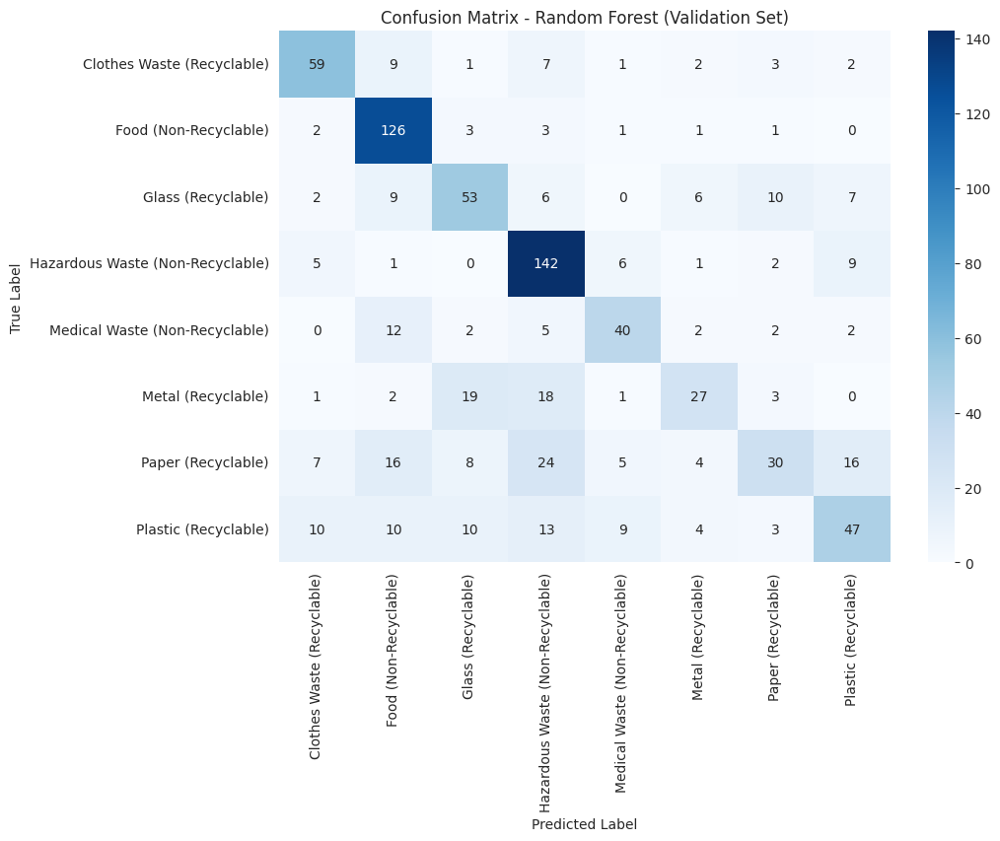

['label_encoder.pkl']

In [14]:
# --- Evaluation on Validation Set ---
y_val_pred = best_rf_model.predict(X_val_scaled)
print("Validation Accuracy:", accuracy_score(y_val, y_val_pred))
print("Validation Classification Report:\n", classification_report(y_val, y_val_pred, target_names=label_encoder.classes_))

# Plot confusion matrix for validation set
cm_val = confusion_matrix(y_val, y_val_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm_val, annot=True, fmt="d", cmap="Blues",xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Random Forest (Validation Set)")
plt.show()

joblib.dump(best_rf_model, 'random_forest_model.pkl')
joblib.dump(scaler, 'scaler.pkl')
joblib.dump(label_encoder, 'label_encoder.pkl')

Test Accuracy: 0.629757785467128
Test Classification Report:
                                   precision    recall  f1-score   support

      Clothes Waste (Recyclable)       0.69      0.76      0.73        54
           Food (Non-Recyclable)       0.72      0.95      0.82        83
              Glass (Recyclable)       0.59      0.76      0.67        63
Hazardous Waste (Non-Recyclable)       0.64      0.81      0.72       120
  Medical Waste (Non-Recyclable)       0.68      0.49      0.57        47
              Metal (Recyclable)       0.83      0.36      0.50        53
              Paper (Recyclable)       0.42      0.38      0.39        72
            Plastic (Recyclable)       0.55      0.35      0.43        86

                        accuracy                           0.63       578
                       macro avg       0.64      0.61      0.60       578
                    weighted avg       0.63      0.63      0.61       578



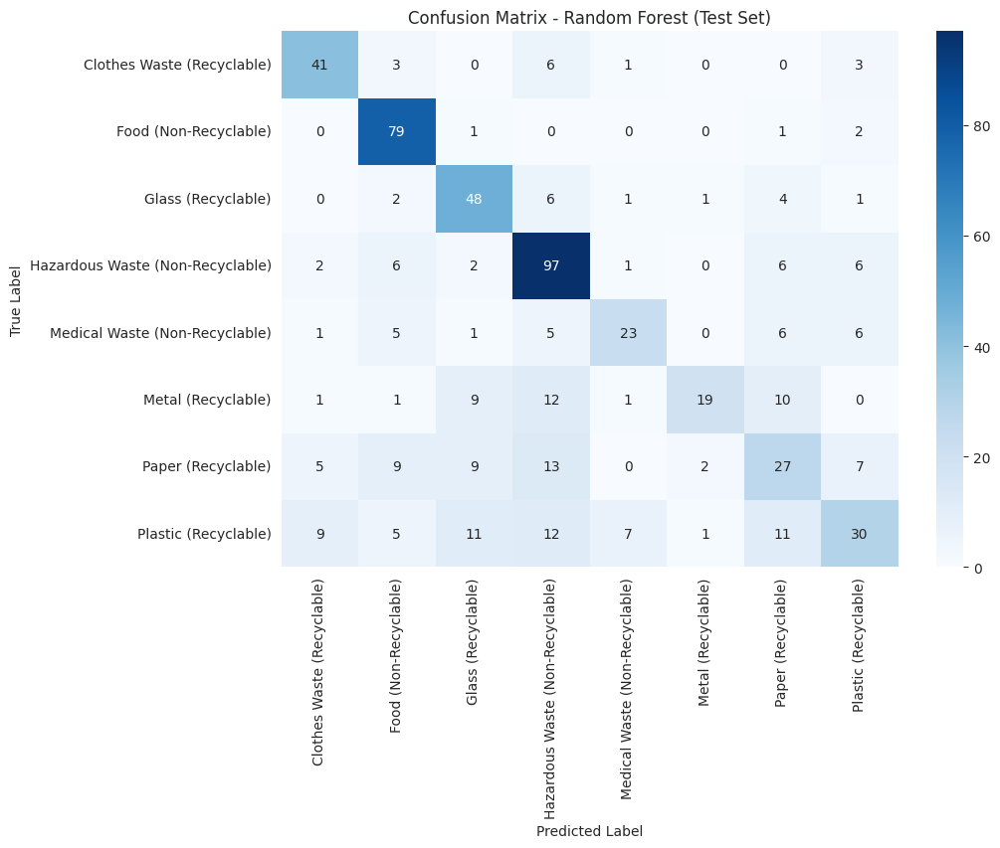

In [15]:
# test feature extraction 
test_features, test_raw_labels, class_names = extract_features_with_labels(model, test_image_dir, test_label_dir, layer_index=layer_index)
if test_features.size == 0:
    raise ValueError("No valid features extracted from test images. Check the image paths and layer index.")
test_labels_encoded = label_encoder.transform(test_raw_labels)
test_features_scaled = scaler.transform(test_features)

# evaluation on Test Set
y_test_pred = best_rf_model.predict(test_features_scaled)
print("Test Accuracy:", accuracy_score(test_labels_encoded, y_test_pred))
print("Test Classification Report:\n", classification_report(test_labels_encoded, y_test_pred, target_names=label_encoder.classes_))

# Plot confusion matrix for test set
cm_test = confusion_matrix(test_labels_encoded, y_test_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues", xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Random Forest (Test Set)")
plt.show()

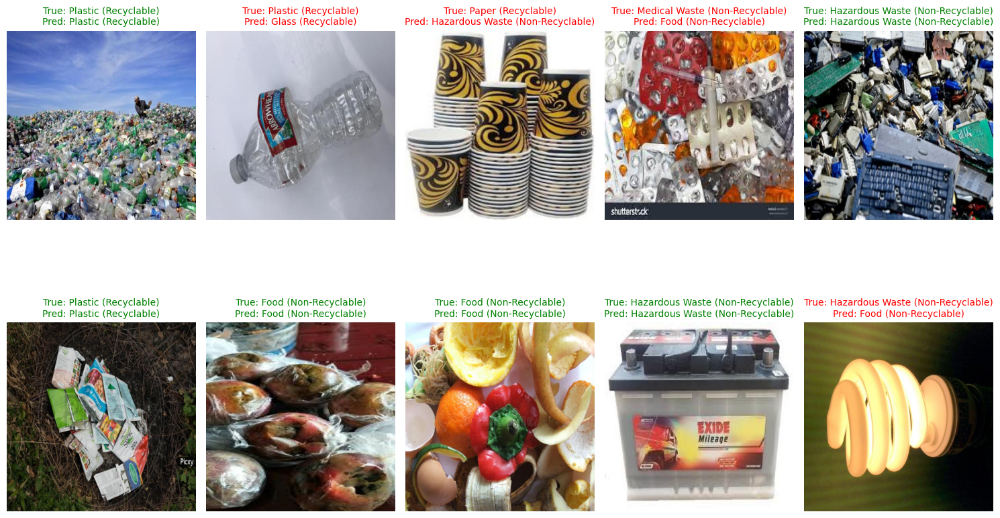

Feature Shape: (4156, 51200)
Feature Min: -0.2784646
Feature Max: 11.999588
Feature Mean: 0.013165157
Feature Std: 0.396529
Min Feature Magnitude: 70.23902
Max Feature Magnitude: 122.43886
Mean Feature Magnitude: 89.55645


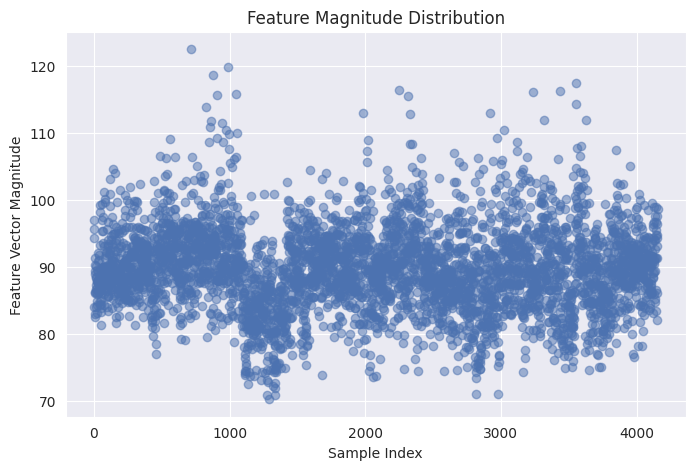

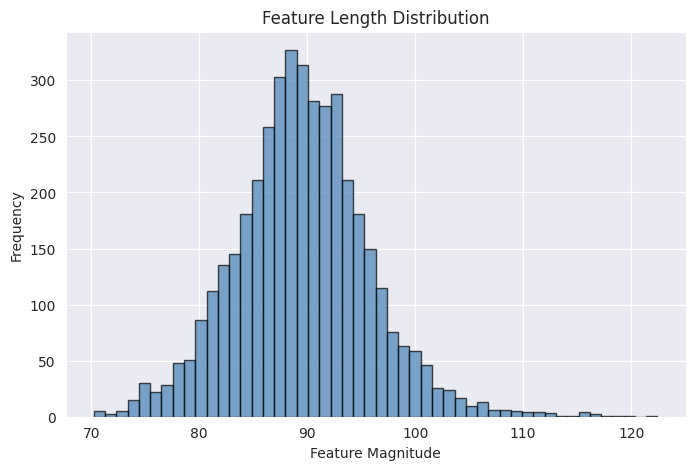

In [16]:
# Display random batch of test images with predictions
test_image_paths = sorted([
    os.path.join(test_image_dir, f) 
    for f in os.listdir(test_image_dir) 
    if f.lower().endswith(('.png', '.jpg', '.jpeg'))
])

test_df = pd.DataFrame({'filepaths': test_image_paths})

display_random_batch(test_df, test_labels_encoded, y_test_pred, label_encoder, batch_size=10)

# --- Feature statistics ---
print("Feature Shape:", features.shape)
print("Feature Min:", np.min(features))
print("Feature Max:", np.max(features))
print("Feature Mean:", np.mean(features))
print("Feature Std:", np.std(features))

feature_lengths = np.linalg.norm(features, axis=1)
print("Min Feature Magnitude:", np.min(feature_lengths))
print("Max Feature Magnitude:", np.max(feature_lengths))
print("Mean Feature Magnitude:", np.mean(feature_lengths))

plt.figure(figsize=(8, 5))
plt.plot(feature_lengths, 'bo', alpha=0.5)
plt.xlabel("Sample Index")
plt.ylabel("Feature Vector Magnitude")
plt.title("Feature Magnitude Distribution")
plt.show()

plt.figure(figsize=(8, 5))
plt.hist(feature_lengths, bins=50, color='steelblue', alpha=0.7, edgecolor='black')
plt.xlabel("Feature Magnitude")
plt.ylabel("Frequency")
plt.title("Feature Length Distribution")
plt.grid(True)
plt.show()

You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.


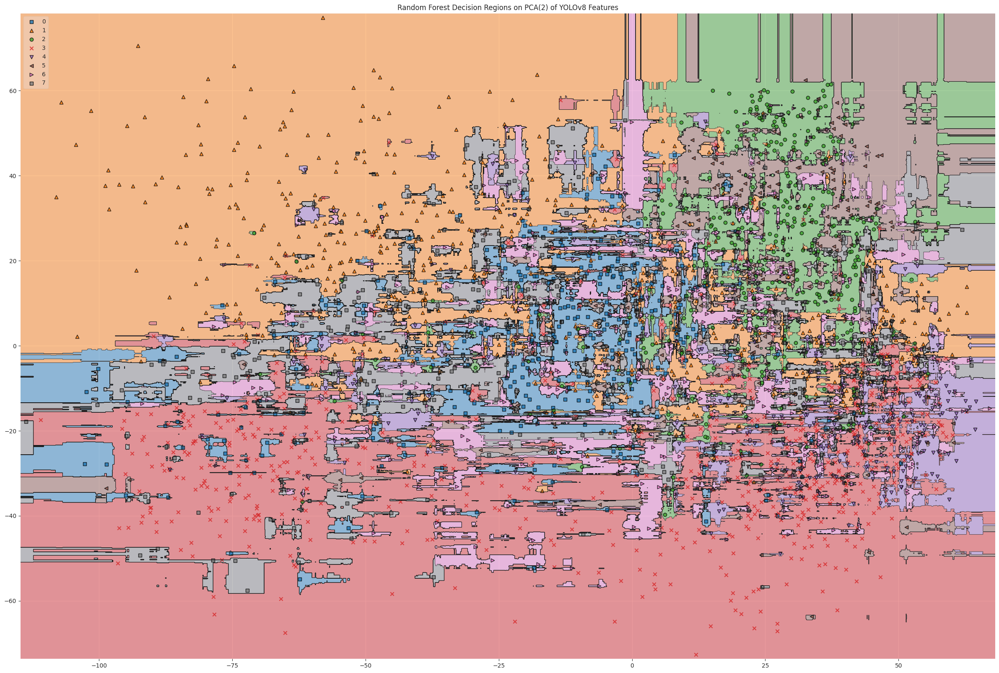

In [17]:
# Fit PCA on the same scaled training features
pca_2 = PCA(n_components=2)
X_train_pca_2 = pca_2.fit_transform(X_train_scaled)

# Train a new Random Forest on these 2 principal components
rf_pca = RandomForestClassifier(random_state=42)
rf_pca.fit(X_train_pca_2, y_train)

# Plot decision regions in 2D
plt.figure(figsize=(30, 20))
plot_decision_regions(X_train_pca_2, y_train, clf=rf_pca, legend=2)
plt.title("Random Forest Decision Regions on PCA(2) of YOLOv8 Features")
plt.show()

# Support Vector Machine (SVM)

To provide a basis for comparison we use the same feature extractions and processes as training the Random Forest classifier.

In [18]:
pca_2d = PCA(n_components=2)
X_train_pca = pca_2d.fit_transform(X_train)

#compute class weights
classes = np.unique(y_train)
class_weights = compute_class_weight(class_weight='balanced', classes=classes, y=y_train)
class_weight_dict = {cls: weight for cls, weight in zip(classes, class_weights)}

#pipeline that includes scaling, PCA and SVM
pipeline = make_pipeline(
    StandardScaler(),
    PCA(n_components=0.93),  # Retain 93% variance; this will be tuned.
    SVC(probability=True, class_weight=class_weight_dict, random_state=42)
)

param_grid = {
    'pca__n_components': [0.90, 0.93, 0.95],  # Variance thresholds to try.
    'svc__C': [0.1, 1, 10, 100],
    'svc__gamma': [0.001, 0.01, 0.1, 1, 10],
    'svc__kernel': ['rbf', 'linear', 'poly', 'sigmoid'],
    'svc__degree': [3, 4]  # Only used if kernel is 'poly'
}

# Set up RandomizedSearchCV with 5-fold stratified cross-validation.
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
random_search = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_grid,
    n_iter=12,
    scoring='accuracy',
    cv=cv,
    n_jobs=-1,
    random_state=42,
    verbose=1
)

random_search.fit(X_train, y_train)

print("Best parameters:", random_search.best_params_)
print("Best cross-validation score:", random_search.best_score_)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters: {'svc__kernel': 'linear', 'svc__gamma': 10, 'svc__degree': 4, 'svc__C': 10, 'pca__n_components': 0.93}
Best cross-validation score: 0.798437358456382


The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.


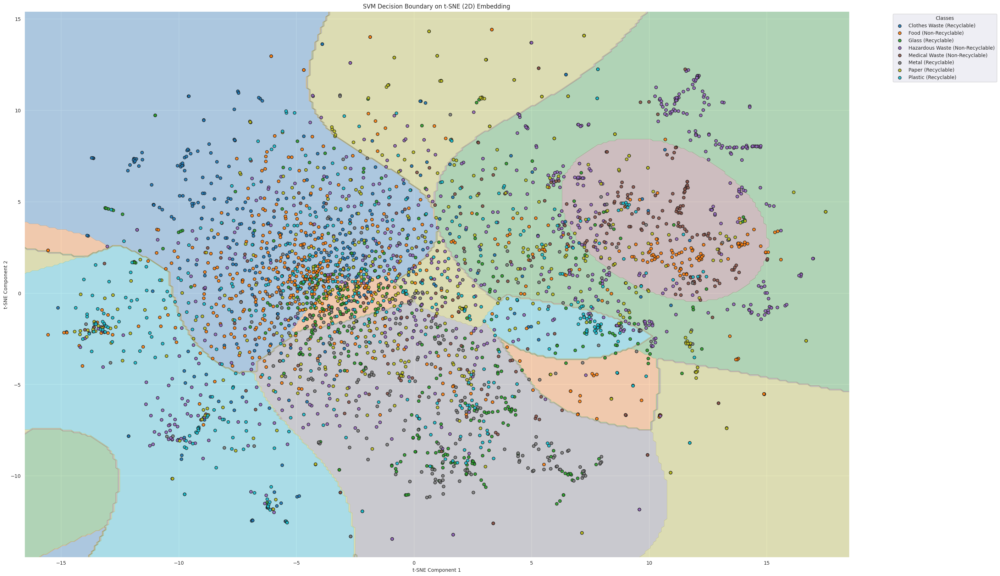

In [19]:
cmap = plt.cm.get_cmap("tab10", 8)

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_train_tsne = tsne.fit_transform(X_train_scaled)

# Train SVM on t-SNE 2D
svm_tsne = SVC(probability=True, class_weight='balanced', random_state=42)
svm_tsne.fit(X_train_tsne, y_train)

# Create a mesh for decision boundaries
x_min, x_max = X_train_tsne[:, 0].min() - 1, X_train_tsne[:, 0].max() + 1
y_min, y_max = X_train_tsne[:, 1].min() - 1, X_train_tsne[:, 1].max() + 1
xx, yy = np.meshgrid(
    np.linspace(x_min, x_max, 300),
    np.linspace(y_min, y_max, 300)
)

# Predict on mesh
Z_tsne = svm_tsne.predict(np.c_[xx.ravel(), yy.ravel()])
Z_tsne = Z_tsne.reshape(xx.shape)

# Plot t-SNE decision boundaries
plt.figure(figsize=(30, 20))
plt.contourf(xx, yy, Z_tsne, alpha=0.3, cmap=cmap)

# Scatter each class separately for a legend
unique_labels = np.unique(y_train)
for label in unique_labels:
    idx = np.where(y_train == label)
    plt.scatter(X_train_tsne[idx, 0], X_train_tsne[idx, 1],
                color=cmap(label),
                label=label_encoder.inverse_transform([label])[0],
                edgecolor='k', alpha=0.9)

plt.title("SVM Decision Boundary on t-SNE (2D) Embedding")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.legend(title="Classes", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

the TSNE 2d projection indicates that the data may not be completely linearly separable, even though the randomizedsearchCV returns linear as optimal.

Validation Accuracy: 0.8341346153846154
Validation Classification Report:
                                   precision    recall  f1-score   support

      Clothes Waste (Recyclable)       0.90      0.83      0.86        84
           Food (Non-Recyclable)       0.93      0.96      0.94       137
              Glass (Recyclable)       0.76      0.82      0.79        93
Hazardous Waste (Non-Recyclable)       0.84      0.95      0.89       166
  Medical Waste (Non-Recyclable)       0.79      0.82      0.80        65
              Metal (Recyclable)       0.81      0.59      0.68        71
              Paper (Recyclable)       0.79      0.79      0.79       110
            Plastic (Recyclable)       0.81      0.73      0.77       106

                        accuracy                           0.83       832
                       macro avg       0.83      0.81      0.82       832
                    weighted avg       0.83      0.83      0.83       832



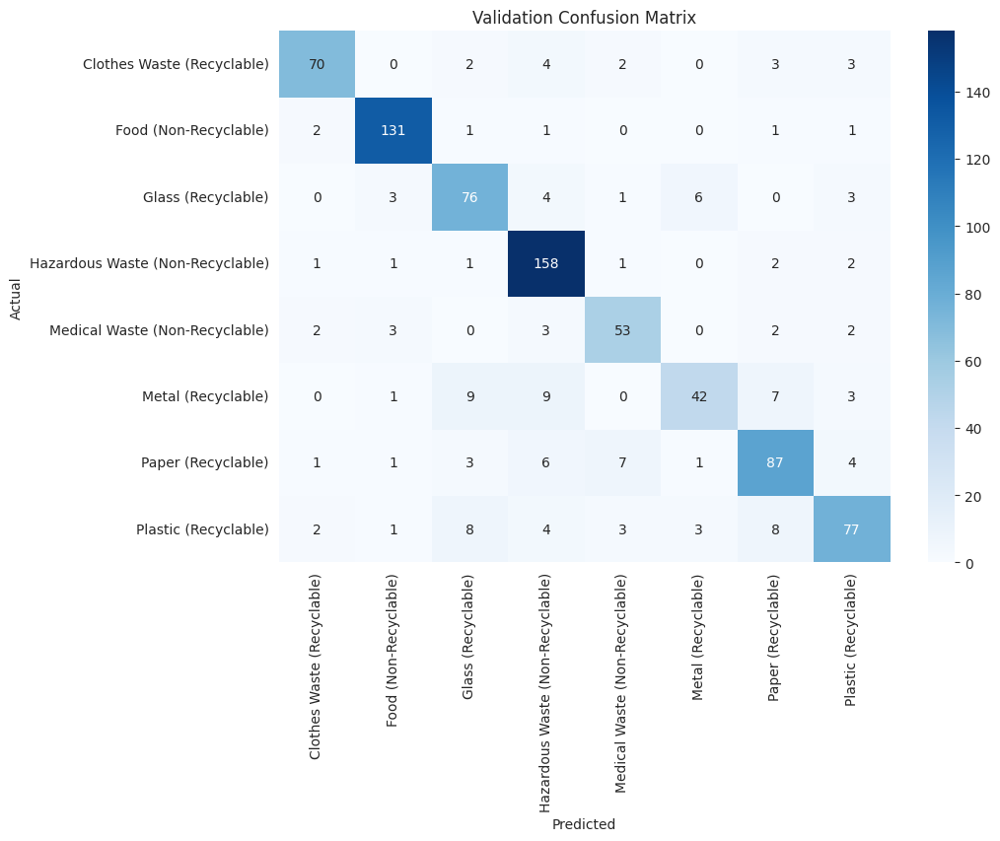

['label_encoder.pkl']

In [20]:
#evaluate on the validation set
X_val_scaled = random_search.best_estimator_.named_steps['standardscaler'].transform(X_val)
y_val_pred = random_search.best_estimator_.predict(X_val)
print("Validation Accuracy:", accuracy_score(y_val, y_val_pred))
print("Validation Classification Report:\n", 
      classification_report(y_val, y_val_pred, target_names=label_encoder.classes_))

# Plot confusion matrix for validation set
conf_matrix = confusion_matrix(y_val, y_val_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Validation Confusion Matrix")
plt.show()

joblib.dump(random_search.best_estimator_, 'svm_best_model.pkl')
joblib.dump(label_encoder, 'label_encoder.pkl')

Test Accuracy: 0.7249134948096886
Test Classification Report:
                                   precision    recall  f1-score   support

      Clothes Waste (Recyclable)       0.68      0.93      0.78        54
           Food (Non-Recyclable)       0.75      0.96      0.84        83
              Glass (Recyclable)       0.78      0.60      0.68        63
Hazardous Waste (Non-Recyclable)       0.69      0.82      0.75       120
  Medical Waste (Non-Recyclable)       0.74      0.66      0.70        47
              Metal (Recyclable)       0.66      0.58      0.62        53
              Paper (Recyclable)       0.90      0.61      0.73        72
            Plastic (Recyclable)       0.69      0.55      0.61        86

                        accuracy                           0.72       578
                       macro avg       0.73      0.71      0.71       578
                    weighted avg       0.73      0.72      0.72       578



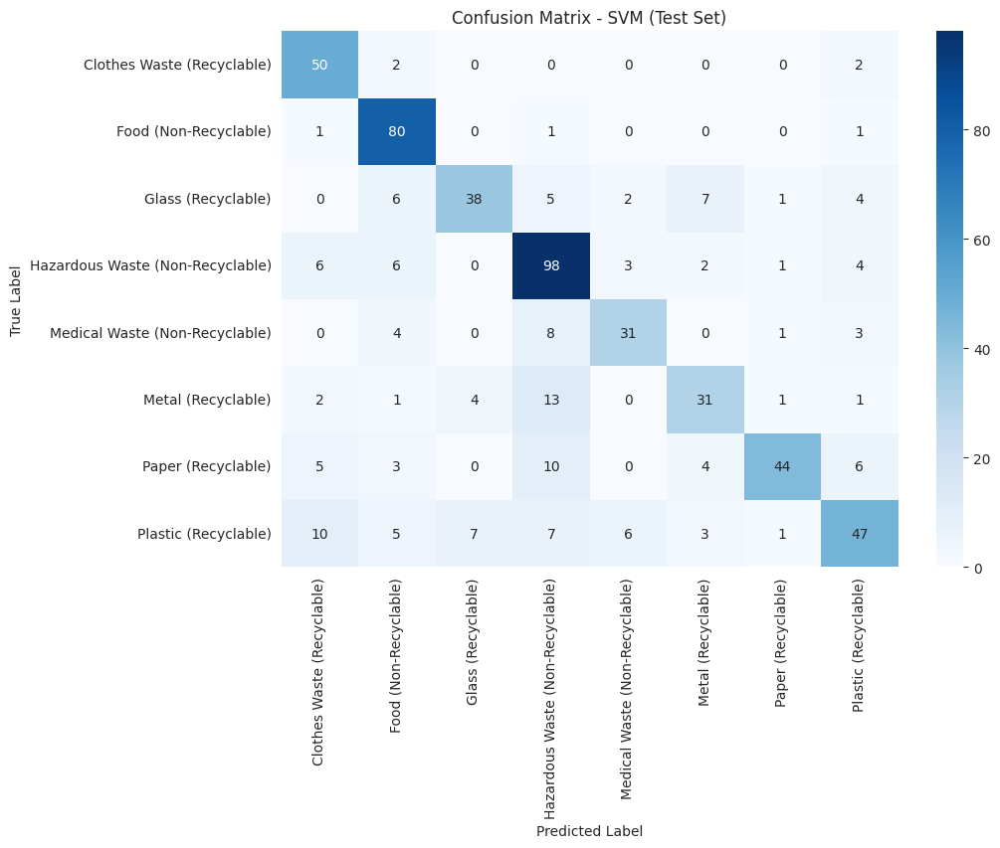

In [21]:
loaded_model = joblib.load('svm_best_model.pkl')
scaler_loaded = loaded_model.named_steps['standardscaler']
test_features_scaled = scaler_loaded.transform(test_features)

y_test_pred = loaded_model.predict(test_features_scaled)
print("Test Accuracy:", accuracy_score(test_labels_encoded, y_test_pred))
print("Test Classification Report:\n", 
      classification_report(test_labels_encoded, y_test_pred, target_names=label_encoder.classes_))

conf_matrix_test = confusion_matrix(test_labels_encoded, y_test_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues',
            xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - SVM (Test Set)")
plt.show()

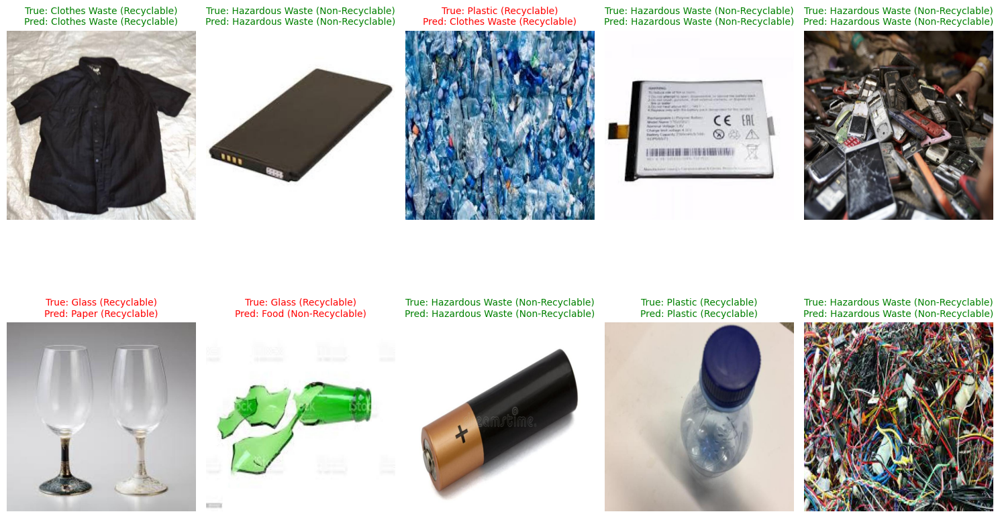

In [22]:
test_image_paths = sorted([
    os.path.join(test_image_dir, f) 
    for f in os.listdir(test_image_dir) 
    if f.lower().endswith(('.png', '.jpg', '.jpeg'))
])
test_df = pd.DataFrame({'filepaths': test_image_paths})
display_random_batch(test_df, test_labels_encoded, y_test_pred, label_encoder, batch_size=10)

# **Conclusion**

From the images shown above it appears that the dataset may be quite noisy.

Poor performing classes (f1 < 0.66): ['Metal (Recyclable)', 'Plastic (Recyclable)']

Displaying examples for class: Metal (Recyclable)


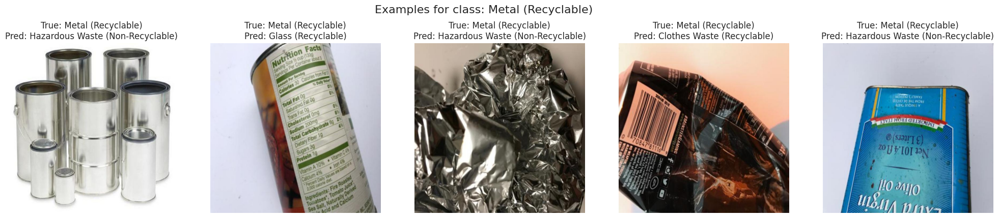


Displaying examples for class: Plastic (Recyclable)


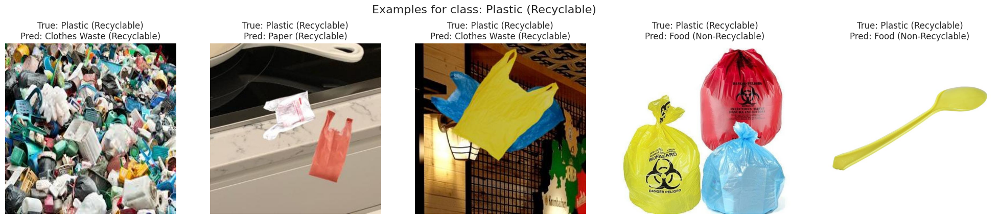

In [23]:
# Compute the classification report as a dictionary 
report_dict = classification_report(
    test_labels_encoded, y_test_pred,
    target_names=label_encoder.classes_,
    output_dict=True
)

# Set an f1-score threshold to determine "poor" performance
f1_threshold = 0.66

# Identify classes with f1-score below threshold (only consider real class names)
poor_classes = [
    cls for cls, metrics in report_dict.items() 
    if cls in label_encoder.classes_ and metrics['f1-score'] <= f1_threshold
]

print("Poor performing classes (f1 < {:.2f}): {}".format(f1_threshold, poor_classes))

# Display images for each poor performing class
for cls in poor_classes:
    print(f"\nDisplaying examples for class: {cls}")
    
    # Get the integer label for the current class
    cls_idx = np.where(label_encoder.classes_ == cls)[0][0]
    
    # Get indices of all test samples that belong to this class
    indices = np.where(test_labels_encoded == cls_idx)[0]
    
    # Among these, identify misclassified samples (predicted != true)
    misclassified_indices = [i for i in indices if y_test_pred[i] != test_labels_encoded[i]]
    
    # If there are no misclassified samples, we simply take all samples for that class
    if len(misclassified_indices) == 0:
        misclassified_indices = indices
    
    # Randomly select up to 5 images to display
    n_display = min(5, len(misclassified_indices))
    selected_indices = random.sample(list(misclassified_indices), n_display)
    
    plt.figure(figsize=(25,5))
    for i, idx in enumerate(selected_indices):
        img_path = test_df.iloc[idx]['filepaths']
        img = cv2.imread(img_path)
        if img is None:
            continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(1, n_display, i+1)
        true_class = cls
        pred_class = label_encoder.inverse_transform([y_test_pred[idx]])[0]
        plt.imshow(img)
        plt.title(f"True: {true_class}\nPred: {pred_class}")
        plt.axis('off')
    plt.suptitle(f"Examples for class: {cls}", fontsize=16)
    plt.show()


From the images, it seems that in these classes are images which are noisy and contain many instances in the image. Additionally, the images can be quite ambiguous. For example, the medical waste class contains drug packaging that may look like metal or hazardous/electronic waste or food packaging.

From the TSNE 2D projection, we can also infer that the images have considerable inter-class overlap.
